## Assignment 1 - Classification


## Learning Outcomes


* Data exploration and pre-processing

* Develop a pipeline to carry out classification

* Compare different metrics and classifiers

The objective is to predict whether or not a credit card client will default for their payment in the next month. We will be using the better of 2 classifiers namely, Random Forest and KNN Classifier, and determine the best of a given set of hyperparameters by using grid search.


In [1]:
!pip install xlrd -U

In [1]:
## Use this for consistency in graphs through out the notebook
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from IPython.display import display

# to make this notebook's output stable across runs
np.random.seed(123)

# To plot pretty figures
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12


def check_data_balance(series, style="seaborn-pastel"):
    with plt.style.context(style):
        unique = series.value_counts()
        display(unique) #show unique value counts of the target
        plt.pie(unique, explode=[0.05]*len(unique), labels=unique.index, autopct='%1.1f%%'); #plot a pie chart for the target to see if data are balanced


In [2]:
pd.__version__

'1.5.3'

**Questions (12 marks total)**

Q1.  Explore the credit card data set provided. You can also access it from the this link 

https://archive.ics.uci.edu/ml/datasets/default+of+credit+card+clients
(https://archive.ics.uci.edu/ml/datasets/default+of+credit+card+clients)

The data is open for public use and no authorizations are required.

You will build a classification model for this default of credit card clients dataset.  The objective is to predict whether or not a credit card client will default for their payment in the next month.

Make sure you perform your analyses and answer the questions in sections below:

1. Data exploration:  ( 3 marks) 

    - Explore the data ( for example look at the data, plot graphs ( histogram, pair plots)
    
2. Data Preprocessing: (4 marks)

    - Make sure you build a full data pipeline ( ie., use the pipeline to apply transformers and estimators- https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html )
    - Do you require any data pre-processing? Are all the features useful? (Use only raw features from this dataset, in other words, no need to create feature crosses or new features)
    - Set the random seed to 123 (For splitting or any other random algorithm)
    - Split data into training (80%) and testing (20%)
    - Use Cross-validation with 5-folds
    - For other parameters, use default

3. Classification: (5 marks)

    - Study the ROC Curve, decide threshold
    - Use 2 classifiers.
    
         a. Random Forest
            - tune only: n_estimators: {4, 5, 10, 20, 50}.  We will be running random forest model using GridSearchCV, determine the best hyperparameter for the given list of n_estimators {4, 5, 10, 20, 50}. n_estimators refers to the number of trees in the forest. We will use CV = 5 and the scoring to be the roc_auc (area under the curve)
          
       b. KNN Classfier 
            - tune only: n_neighbors: {3, 5, 10, 20}. You may perform similar GridSearchCV as in the previous exercise with a given list of n_neightbors. 
        
    - Which one performs better in the cross validation? Note down your observations and give comments.
    
You may refer to the documentation for RandomForests and KNN Classifiers, for the different parameters and options available in the scikit-learn library.
http://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
http://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html



In [3]:
### Thomas Tang
### Your code here
## Feel free to use multiple cells  and continue from here:

#df = pd.read_excel("https://archive.ics.uci.edu/ml/machine-learning-databases/00350/default%20of%20credit%20card%20clients.xls", skiprows=1, header=0, index_col=0)
#df = pd.read_excel("/path/to/file/default of credit card clients.xls", sheet = 0, skiprows= 1, header = 0)
df = pd.read_excel("./default of credit card clients.xls", sheet_name = 0, skiprows= 1, header = 0)
df


,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,29996,220000,1,3,1,39,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,29997,150000,1,3,2,43,-1,-1,-1,-1,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,29998,30000,1,2,2,37,4,3,2,-1,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,29999,80000,1,3,1,41,1,-1,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   ID                          30000 non-null  int64
 1   LIMIT_BAL                   30000 non-null  int64
 2   SEX                         30000 non-null  int64
 3   EDUCATION                   30000 non-null  int64
 4   MARRIAGE                    30000 non-null  int64
 5   AGE                         30000 non-null  int64
 6   PAY_0                       30000 non-null  int64
 7   PAY_2                       30000 non-null  int64
 8   PAY_3                       30000 non-null  int64
 9   PAY_4                       30000 non-null  int64
 10  PAY_5                       30000 non-null  int64
 11  PAY_6                       30000 non-null  int64
 12  BILL_AMT1                   30000 non-null  int64
 13  BILL_AMT2                   30000 non-null  int64
 14  BILL_A

0    23364
1     6636
Name: default payment next month, dtype: int64

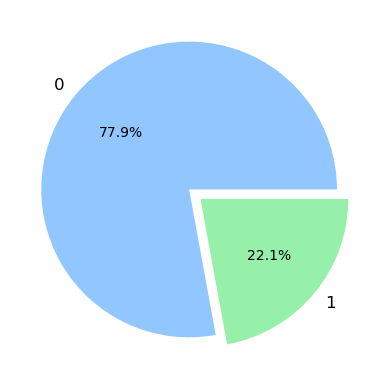

In [5]:
check_data_balance(df["default payment next month"])

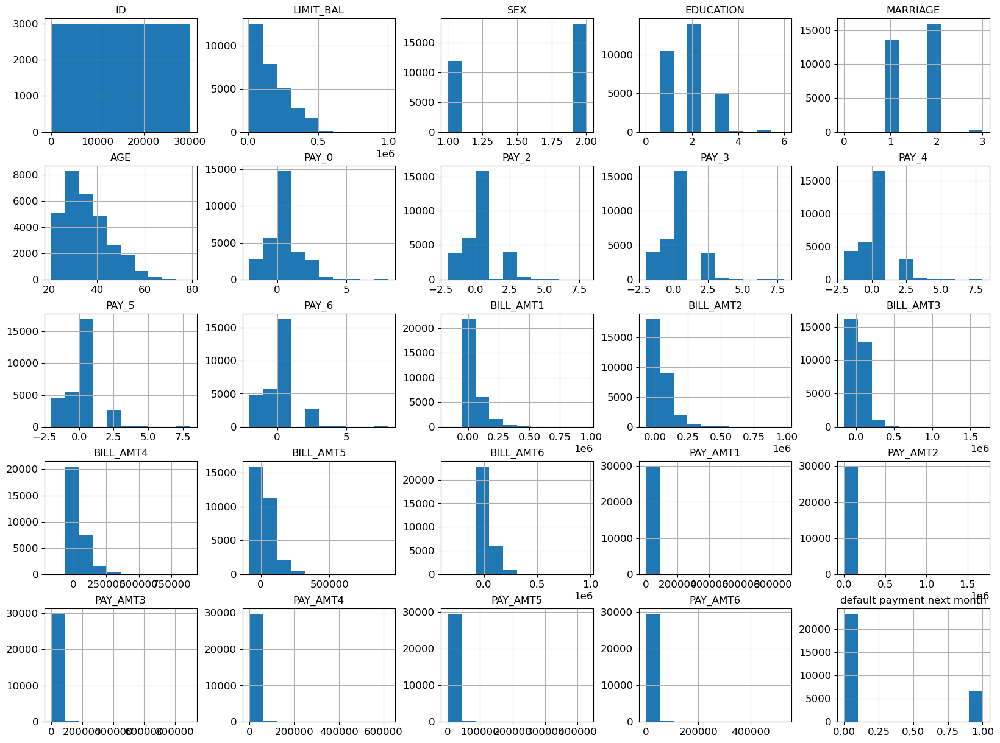

In [6]:
_ = df.hist(figsize=(20,15))

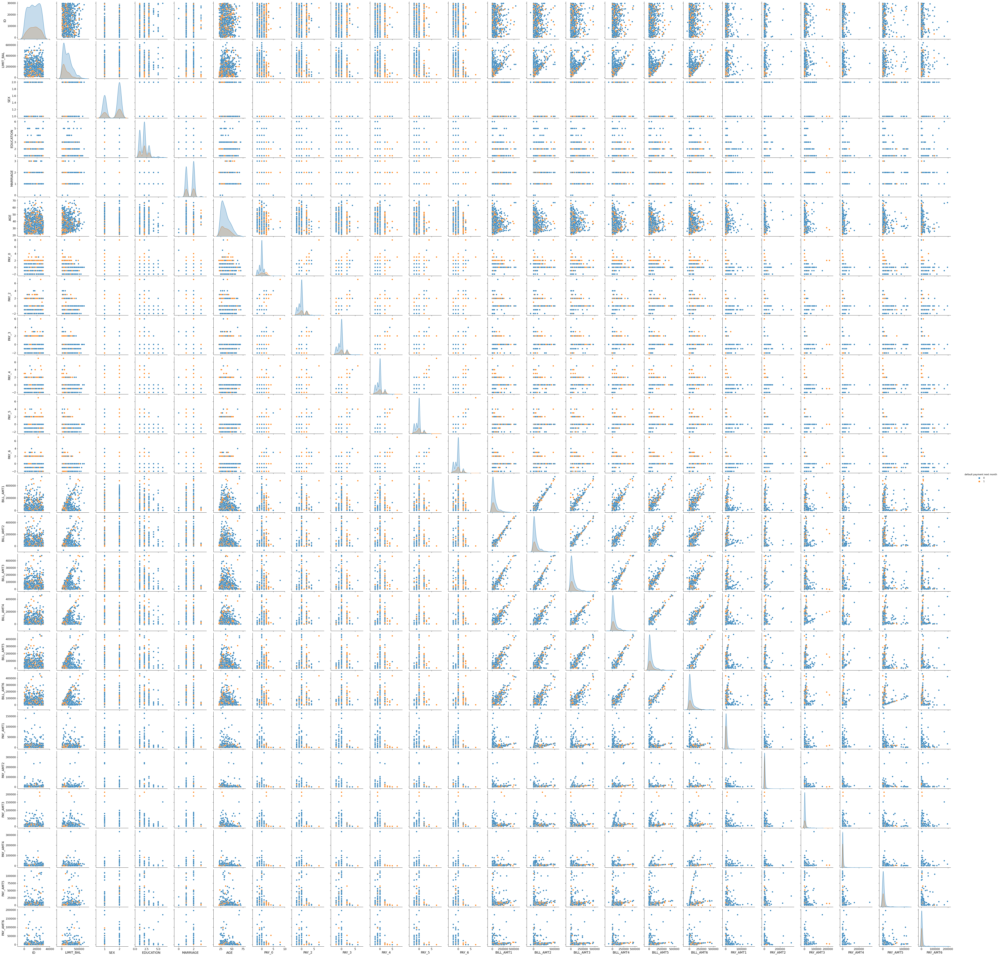

In [7]:
# lecture version
sns.pairplot(df.sample(1000, random_state=123), hue="default payment next month")

In [8]:
# my version
#print(df.corr())
#g = sns.pairplot(df.sample(len(df['ID'])))

In [9]:

# DEL later , TEST (this portion maybe useless)

#sns.distplot(df['SEX'])
#sns.distplot(df['EDUCATION'])
#ns.distplot(df['MARRIAGE'])
#sns.distplot(df['AGE'])

#sns.distplot(df['PAY_0'])
#sns.distplot(df['PAY_2'])
#sns.distplot(df['PAY_3'])
#sns.distplot(df['PAY_4'])
#sns.distplot(df['PAY_5'])
#sns.distplot(df['PAY_6'])

###sns.distplot(df['BILL_AMT1'])
###sns.distplot(df['BILL_AMT2'])
###sns.distplot(df['BILL_AMT3'])
###sns.distplot(df['BILL_AMT4'])
###sns.distplot(df['BILL_AMT5'])
###sns.distplot(df['BILL_AMT6'])

###sns.distplot(df['PAY_AMT1'])
###sns.distplot(df['PAY_AMT2'])
###sns.distplot(df['PAY_AMT3'])
###sns.distplot(df['PAY_AMT4'])
###sns.distplot(df['PAY_AMT5'])
###sns.distplot(df['PAY_AMT6'])


#sns.distplot(np.log(df['BILL_AMT1']))
#df['log_BILL_AMT'] = np.log(df['BILL_AMT1'])


#sns.distplot(np.log(df_explore['price']))
#df_explore['log_price'] = np.log(df_explore['price'])

           BILL_AMT1  BILL_AMT2  BILL_AMT3  BILL_AMT4  BILL_AMT5  BILL_AMT6
BILL_AMT1   1.000000   0.951484   0.892279   0.860272   0.829779   0.802650
BILL_AMT2   0.951484   1.000000   0.928326   0.892482   0.859778   0.831594
BILL_AMT3   0.892279   0.928326   1.000000   0.923969   0.883910   0.853320
BILL_AMT4   0.860272   0.892482   0.923969   1.000000   0.940134   0.900941
BILL_AMT5   0.829779   0.859778   0.883910   0.940134   1.000000   0.946197
BILL_AMT6   0.802650   0.831594   0.853320   0.900941   0.946197   1.000000


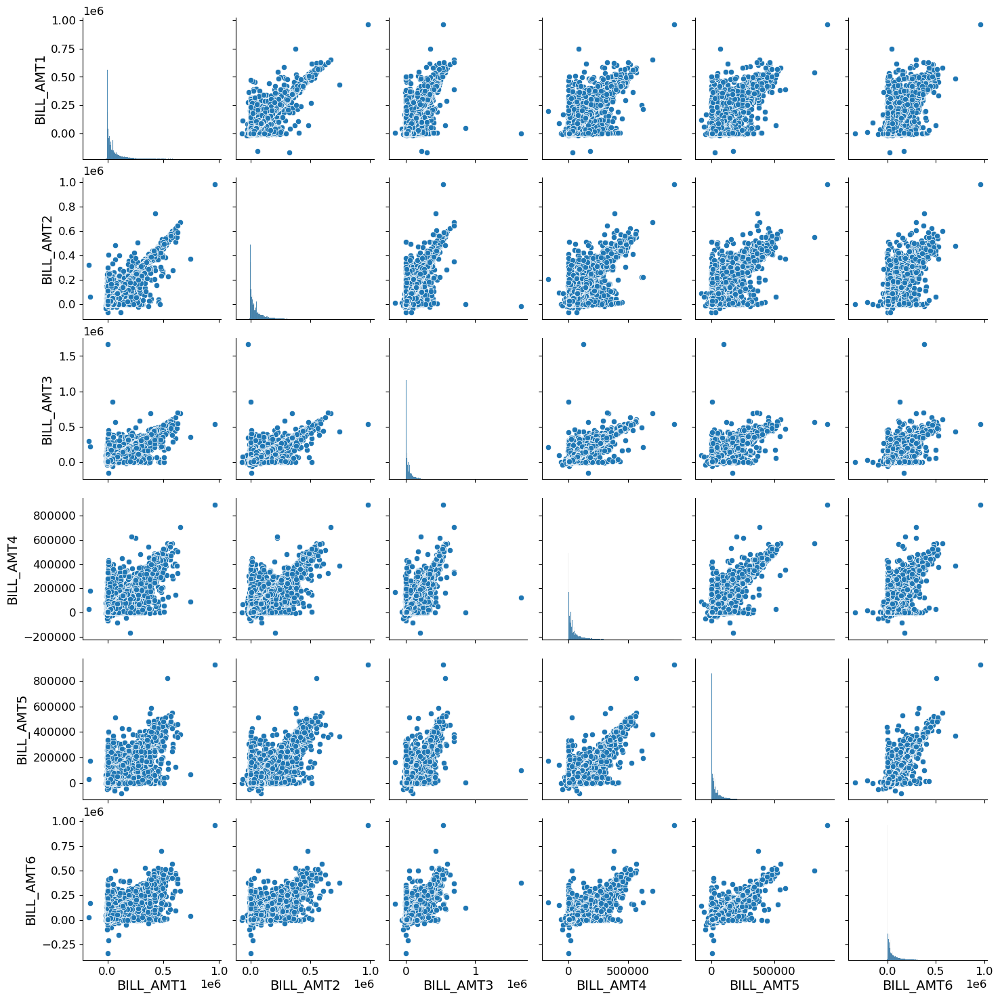

In [10]:
# This is to ZOOM-IN to BILL_AMT1 to BILL_AMT1 observed with strong corelation (close to 1) from above OVERALL pairplot 
df_BILL_AMT1_to_AMT6 = df[['BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6']].copy()
df_BILL_AMT1_to_AMT6
print(df_BILL_AMT1_to_AMT6.corr())
g = sns.pairplot(df_BILL_AMT1_to_AMT6.sample(len(df_BILL_AMT1_to_AMT6['BILL_AMT1'])))

In [11]:
## Given data on column definitiom
##
## X6 - X11: History of past payment. Past monthly payment records (from April to September, 2005) as follows: 
#  X6 (PAY_0) = the repayment status in 09, 2005;
#  X7 (PAY_2) = the repayment status in 08, 2005; 
#  X8 (PAY_3) = the repayment status in 07, 2005;
#  X9 (PAY_4) = the repayment status in 06, 2005; 
# X10 (PAY_5) = the repayment status in 05, 2005;
# X11 (PAY_6) = the repayment status in 04, 2005. 
#   The measurement scale for the repayment status is: 
#      -1 = pay duly; 
#       1 = payment delay for 1 month; 
#       2 = payment delay for 2 months; ... 
#       8 = payment delay for 8 months; 
#       9 = payment delay for 9 months and above.
#
## X12-X17: Amount of bill statement (NT dollar)
# X12 (BILL_AMT1) = amount of bill statement in 09, 2005; 
# X13 (BILL_AMT2) = amount of bill statement in 08, 2005;
# X14 (BILL_AMT3) = amount of bill statement in 07, 2005; 
# X15 (BILL_AMT4) = amount of bill statement in 06, 2005; 
# X16 (BILL_AMT5) = amount of bill statement in 05, 2005; 
# X17 (BILL_AMT6) = amount of bill statement in 04, 2005. 
#
## X18-X23: Amount of previous payment (NT dollar). 
# X18 (PAY_AMT1) = amount paid in 09, 2005; 
# X19 (PAY_AMT2) = amount paid in 08, 2005;
# X20 (PAY_AMT3) = amount paid in 07, 2005; 
# X21 (PAY_AMT4) = amount paid in 06, 2005; 
# X22 (PAY_AMT5) = amount paid in 05, 2005; 
# X23 (PAY_AMT6) = amount paid in 04, 2005; 


## Machine Learning - Choose X and y

In [12]:
TARGET = "default payment next month"

# Xuan's
#columns_predictors = [col for col in df.columns if col not in [TARGET]]
#columns_categorical = ['SEX', 'EDUCATION', 'MARRIAGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']
#columns_numerical = [col for col in columns_predictors if col not in columns_categorical]

# My Test. trimmed off SEX, EDUCATION, MARRIAGE, as seen low effect from box plot result
columns_predictors =['LIMIT_BAL', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']
columns_categorical = ['PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']
columns_numerical = [col for col in columns_predictors if col not in columns_categorical]

print(f"TARGET: {TARGET}")
print(f"columns_predictors: {columns_predictors}")
print(f"columns_categorical: {columns_categorical}")
print(f"columns_numerical: {columns_numerical}")

TARGET: default payment next month
columns_predictors: ['LIMIT_BAL', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']
columns_categorical: ['PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6']
columns_numerical: ['LIMIT_BAL', 'AGE', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']


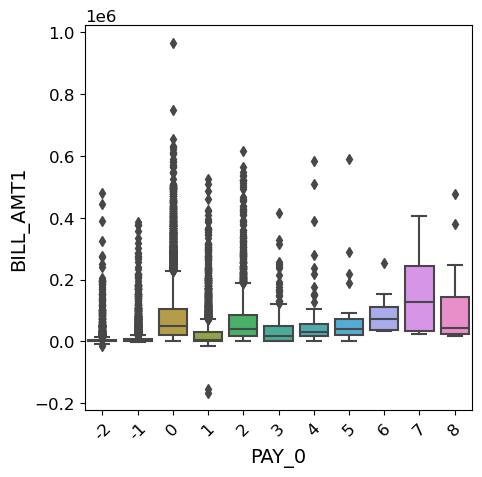

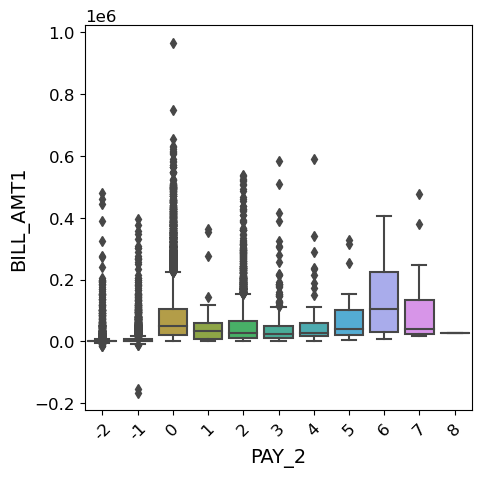

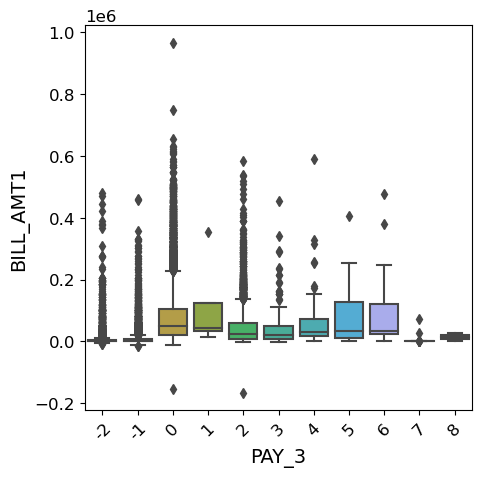

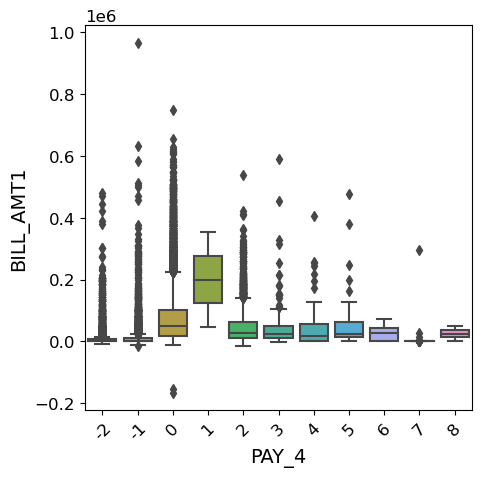

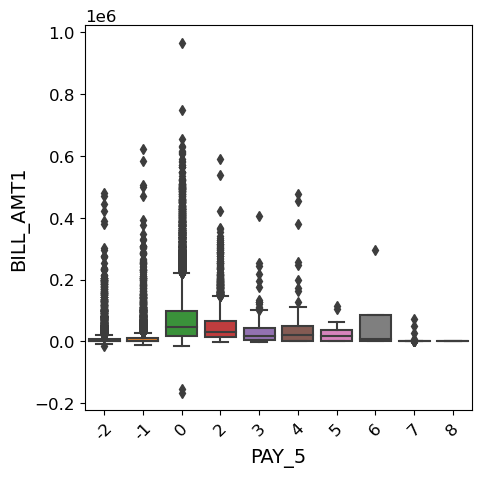

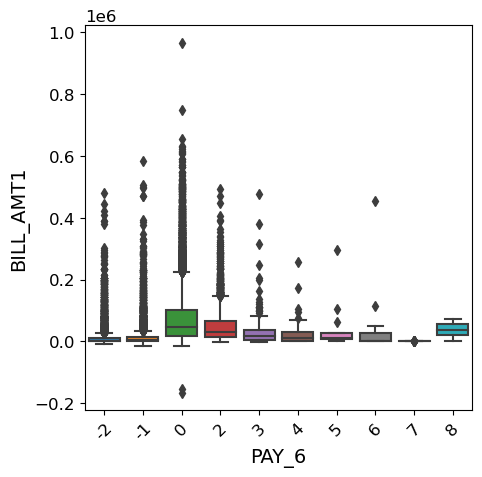

In [13]:
for item in [x for x in columns_categorical]:  # if x != 'amenities']:
#    if item == 'amenities':
#        next
    plt.figure(figsize=(5,5))
    sns.boxplot(x=item, y='BILL_AMT1', data=df)
    if len(df[item].unique()) > 4:
        plt.xticks(rotation=45)
    plt.show()
    


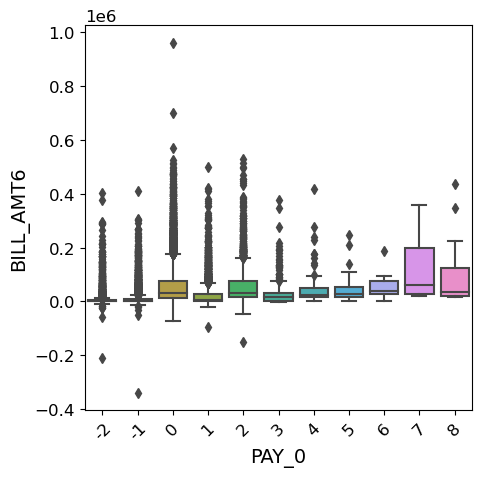

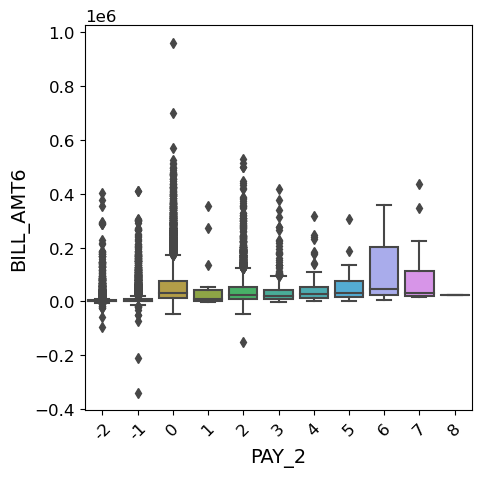

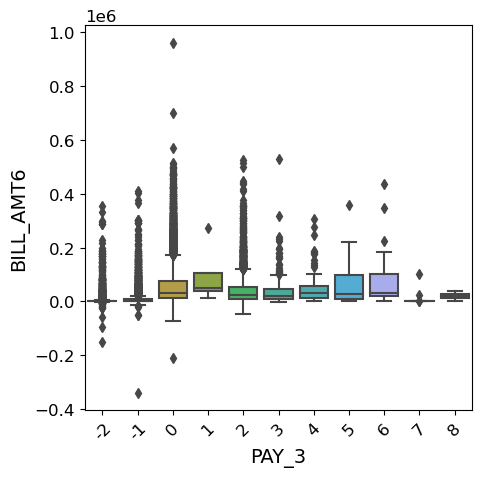

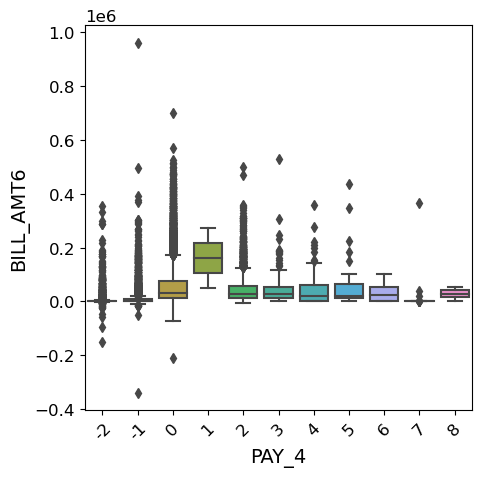

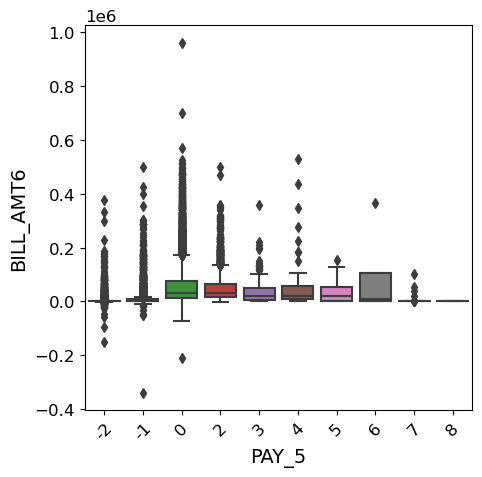

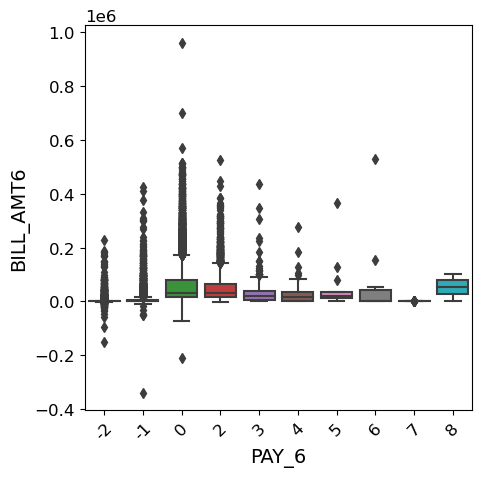

In [14]:
for item in [x for x in columns_categorical]:  # if x != 'amenities']:
#    if item == 'amenities':
#        next
    plt.figure(figsize=(5,5))
    sns.boxplot(x=item, y='BILL_AMT6', data=df)
    #sns.boxplot(x=item, y='default payment next month', data=df)
    if len(df[item].unique()) > 4:
        plt.xticks(rotation=45)
    plt.show()    

In [15]:
X = df[columns_predictors]
y = df[TARGET]
display(X)
display(y)

,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0
1,120000,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000
2,90000,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000
3,50000,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000
4,50000,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000,39,0,0,0,0,0,0,188948,192815,208365,88004,31237,15980,8500,20000,5003,3047,5000,1000
29996,150000,43,-1,-1,-1,-1,0,0,1683,1828,3502,8979,5190,0,1837,3526,8998,129,0,0
29997,30000,37,4,3,2,-1,0,0,3565,3356,2758,20878,20582,19357,0,0,22000,4200,2000,3100
29998,80000,41,1,-1,0,0,0,-1,-1645,78379,76304,52774,11855,48944,85900,3409,1178,1926,52964,1804


0        1
1        1
2        0
3        0
4        0
        ..
29995    0
29996    0
29997    1
29998    1
29999    1
Name: default payment next month, Length: 30000, dtype: int64

## Train-test split

In [16]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=123, stratify=y) #stratified sampling based on the target
print(f"X_train.shape: {X_train.shape}")
print(f"X_test.shape: {X_test.shape}")
print(f"y_train.shape: {y_train.shape}")
print(f"y_test.shape: {y_test.shape}")

X_train.shape: (24000, 20)
X_test.shape: (6000, 20)
y_train.shape: (24000,)
y_test.shape: (6000,)


In [17]:
display(X_train)
display(y_train)

,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
23833,80000,50,2,3,2,2,2,0,2684,2502,2321,4247,3914,3242,0,0,2001,4,1073,23076
27012,500000,43,0,0,0,0,0,0,124362,126860,129576,129863,120781,98163,4567,4787,4745,4256,3321,3326
12496,60000,31,0,-1,2,2,2,2,3610,855,111,411,261,6695,900,0,300,0,6500,0
25519,280000,34,-1,-1,2,-1,-1,-1,38,34163,32800,131200,3950,0,34163,0,131200,3950,0,716
18880,400000,30,-2,-2,-1,-1,0,0,2912,2668,3222,21755,15258,16002,2668,3222,21755,500,1000,475
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3228,50000,26,0,0,0,0,0,0,43721,42060,42332,37872,35748,33631,2228,2500,1660,1457,1300,1340
18273,70000,47,0,0,0,2,0,0,27847,29073,34578,33723,35156,37370,2000,6000,0,2000,2784,0
1548,500000,42,-1,-1,-1,2,-1,-1,30439,1844,844,614,2887,3850,1844,1000,0,3000,4000,6000
7576,50000,30,0,0,0,0,0,0,32781,31702,26829,18948,18830,19358,1489,1326,642,2000,824,1000


23833    0
27012    0
12496    0
25519    0
18880    0
        ..
3228     0
18273    1
1548     1
7576     1
13416    0
Name: default payment next month, Length: 24000, dtype: int64

0    18691
1     5309
Name: default payment next month, dtype: int64

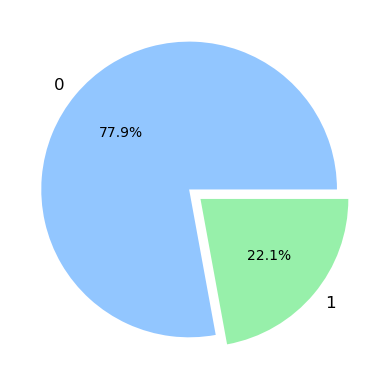

In [18]:
check_data_balance(y_train)

0    4673
1    1327
Name: default payment next month, dtype: int64

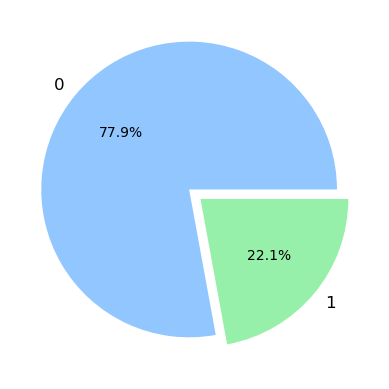

In [19]:
check_data_balance(y_test)

## Define the pipeline(s)

In [20]:
from sklearn.pipeline import Pipeline #each pipeline can have multiple steps
from sklearn.compose import ColumnTransformer #for selecting specific columns and transforming them with individual pipelines
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder #specific transformations we want to use in our pipelines

pipeline_categorical = Pipeline([
  ('onehot', OneHotEncoder(handle_unknown="ignore")),
])

pipeline_numerical = Pipeline([
  ('scaler', MinMaxScaler(feature_range=(0,1))),
])

pipeline_full = ColumnTransformer([
  ("categorical", pipeline_categorical, columns_categorical),
  ("numerical", pipeline_numerical, columns_numerical),
])

In [21]:
pipeline_full

ColumnTransformer(transformers=[('categorical',
                                 Pipeline(steps=[('onehot',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5',
                                  'PAY_6']),
                                ('numerical',
                                 Pipeline(steps=[('scaler', MinMaxScaler())]),
                                 ['LIMIT_BAL', 'AGE', 'BILL_AMT1', 'BILL_AMT2',
                                  'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5',
                                  'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2',
                                  'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5',
                                  'PAY_AMT6'])])

In [22]:
X_train[columns_categorical]

,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6
23833,2,3,2,2,2,0
27012,0,0,0,0,0,0
12496,0,-1,2,2,2,2
25519,-1,-1,2,-1,-1,-1
18880,-2,-2,-1,-1,0,0
...,...,...,...,...,...,...
3228,0,0,0,0,0,0
18273,0,0,0,2,0,0
1548,-1,-1,-1,2,-1,-1
7576,0,0,0,0,0,0


In [23]:
# testing
#print (pipeline_numerical.fit_transform(X_train[columns_numerical]).shape)
print (pipeline_categorical.fit_transform(X_train[columns_categorical]).toarray().shape)
#print (pipeline_full.fit_transform(X_train).toarray().shape)

(24000, 64)


## Apply the pipeline

NOTE: <font color="red">Do not fit the pipeline on X_test or X</font>

The correct way to do it is to fit the pipeline on X_train once, and then use the fitted pipeline to transform both X_train and X_test. The pipeline should remember the information from X_train (i.e. the one hot encoder will remember the categories from X_train and the scaler will remember the feature ranges from X_train), and then we will use that information to transform the X_test, just as if we are dealing with the real unseen data in production. X_test transformed in this way will help reflect the model's true performance when it encounters unseen data.

In [24]:
pipeline_full.fit(X_train)
X_train_transformed = pipeline_full.transform(X_train)
X_test_transformed = pipeline_full.transform(X_test)
print(f"X_train_transformed.shape: {X_train_transformed.shape}")
print(f"X_test_transformed.shape: {X_test_transformed.shape}")

X_train_transformed.shape: (24000, 78)
X_test_transformed.shape: (6000, 78)


## FAQ: How to access attributes within the pipelines?

In [25]:
pipeline_full.named_transformers_

{'categorical': Pipeline(steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))]),
 'numerical': Pipeline(steps=[('scaler', MinMaxScaler())])}

In [26]:
pipeline_full.named_transformers_["categorical"]

Pipeline(steps=[('onehot', OneHotEncoder(handle_unknown='ignore'))])

In [27]:
pipeline_full.named_transformers_["numerical"]

Pipeline(steps=[('scaler', MinMaxScaler())])

In [28]:
pipeline_full.named_transformers_["numerical"].named_steps

{'scaler': MinMaxScaler()}

In [29]:
pipeline_full.named_transformers_["numerical"].named_steps["scaler"].feature_range

(0, 1)

In [30]:
pipeline_full.named_transformers_["categorical"].named_steps

{'onehot': OneHotEncoder(handle_unknown='ignore')}

In [31]:
pipeline_full.named_transformers_["categorical"].named_steps["onehot"].get_feature_names_out() #this is the column names after one-hot encoding

array(['PAY_0_-2', 'PAY_0_-1', 'PAY_0_0', 'PAY_0_1', 'PAY_0_2', 'PAY_0_3',
       'PAY_0_4', 'PAY_0_5', 'PAY_0_6', 'PAY_0_7', 'PAY_0_8', 'PAY_2_-2',
       'PAY_2_-1', 'PAY_2_0', 'PAY_2_1', 'PAY_2_2', 'PAY_2_3', 'PAY_2_4',
       'PAY_2_5', 'PAY_2_6', 'PAY_2_7', 'PAY_2_8', 'PAY_3_-2', 'PAY_3_-1',
       'PAY_3_0', 'PAY_3_1', 'PAY_3_2', 'PAY_3_3', 'PAY_3_4', 'PAY_3_5',
       'PAY_3_6', 'PAY_3_7', 'PAY_3_8', 'PAY_4_-2', 'PAY_4_-1', 'PAY_4_0',
       'PAY_4_1', 'PAY_4_2', 'PAY_4_3', 'PAY_4_4', 'PAY_4_5', 'PAY_4_6',
       'PAY_4_7', 'PAY_4_8', 'PAY_5_-2', 'PAY_5_-1', 'PAY_5_0', 'PAY_5_2',
       'PAY_5_3', 'PAY_5_4', 'PAY_5_5', 'PAY_5_6', 'PAY_5_7', 'PAY_5_8',
       'PAY_6_-2', 'PAY_6_-1', 'PAY_6_0', 'PAY_6_2', 'PAY_6_3', 'PAY_6_4',
       'PAY_6_5', 'PAY_6_6', 'PAY_6_7', 'PAY_6_8'], dtype=object)

## Train an ML model on the transformed training set

## 1) Classification: LogisticRegression

In [32]:
%%time
from sklearn.linear_model import LogisticRegression

model = LogisticRegression(n_jobs=-1, random_state=123)
model.fit(X_train_transformed, y_train)

CPU times: total: 234 ms
Wall time: 6.88 s


LogisticRegression(n_jobs=-1, random_state=123)

## Evaluate the model on the transformed testing set

In [33]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

y_pred = model.predict(X_test_transformed)
y_pred_proba = model.predict_proba(X_test_transformed) #to calculate ROC_AUC, we need model.predict_proba() instead of model.pred()

print(f"accuracy_score: {accuracy_score(y_test, y_pred)}")
print(f"precision_score: {precision_score(y_test, y_pred)}")
print(f"recall_score: {recall_score(y_test, y_pred)}")
print(f"f1_score: {f1_score(y_test, y_pred)}")
print(f"roc_auc_score: {roc_auc_score(y_test, y_pred_proba[:,1])}")

accuracy_score: 0.8201666666666667
precision_score: 0.6890243902439024
recall_score: 0.34061793519216277
f1_score: 0.4558749369641956
roc_auc_score: 0.769697041043394


In [34]:
# what if we don't do the pipeline transformation?
model = LogisticRegression(n_jobs=-1, random_state=123)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
print(f"accuracy_score: {accuracy_score(y_test, y_pred)}")

accuracy_score: 0.7788333333333334


## Saving and loading

In [35]:
import pickle
with open("model.pkl", "wb") as f:
  pickle.dump(model, f)

In [36]:
with open("model.pkl", "rb") as f:
  loaded_model = pickle.load(f)

loaded_model

LogisticRegression(n_jobs=-1, random_state=123)

In [37]:
# Below 2 line is for ML model to run on PROD data (not applicable here, but useful in future)

#X_prod_transformed = loaded_pipeline.tranform(X_prod)
#y_pred = loaded_model.predict(X_prod_transformed)

In [38]:
# module 3_1
# 80%-20% and 5-fold cross-validation of the data

from sklearn import linear_model as lm
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier as dtc
from sklearn.neighbors import KNeighborsClassifier as knnc
from sklearn.naive_bayes import GaussianNB as gnb
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split 
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.ensemble import RandomForestClassifier as rfc

In [39]:
# SOMETHING HERE >>>>>>

data_mod = df[(df.SEX != 0) & (df.EDUCATION != 0) & (df.MARRIAGE != 0) & (df.AGE != 0)]
train, test = train_test_split(data_mod, test_size=0.2)
print(data_mod.shape)
print(train.shape)
print(test.shape)

(29932, 25)
(23945, 25)
(5987, 25)


In [40]:
features = columns_numerical
#features = ['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', \
#            'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', \
#            'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', \
#            'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6']

target = TARGET

classifiers = [
    knnc(),
    dtc(),
    SVC(),
    #####SVC(kernel='linear'),
    gnb(),
    rfc()
]
classifier_names = [
    'K nearest neighbors',
    'Decision Tree Classifier',
    'SVM classifier with RBF kernel',
    #####'SVM classifier with linear kernel',
    'Gaussian Naive Bayes',
    'Random Forest Classifier'
]

In [41]:
for clf, clf_name in zip(classifiers, classifier_names):
    cv_scores = cross_val_score(clf, train[features], train[target], cv=5)
    
    print(clf_name, ' mean accuracy: ', round(cv_scores.mean()*100, 3), '% std: ', round(cv_scores.var()*100, 3),'%')

K nearest neighbors  mean accuracy:  75.448 % std:  0.002 %
Decision Tree Classifier  mean accuracy:  69.672 % std:  0.0 %
SVM classifier with RBF kernel  mean accuracy:  77.807 % std:  0.0 %
Gaussian Naive Bayes  mean accuracy:  35.911 % std:  0.007 %
Random Forest Classifier  mean accuracy:  78.488 % std:  0.004 %


In [42]:
# Which one performs better in the cross validation? Note down your observations and give comments.
# K nearest neighbors  mean accuracy < Random Forest Classifier  mean accuracy
# Therefor Random Forest Classofier is better having a higher score.

##  Classification: KNN + RFC

In [43]:
final_model_knnc = knnc().fit(train[features], train[target])
final_model_rfc = rfc().fit(train[features], train[target])

In [44]:
y_test = test['default payment next month'].to_frame()
X_test=test.drop(['default payment next month'], axis=1)

test accuracy for KNN classifier with a linear kernel: 75.58 %


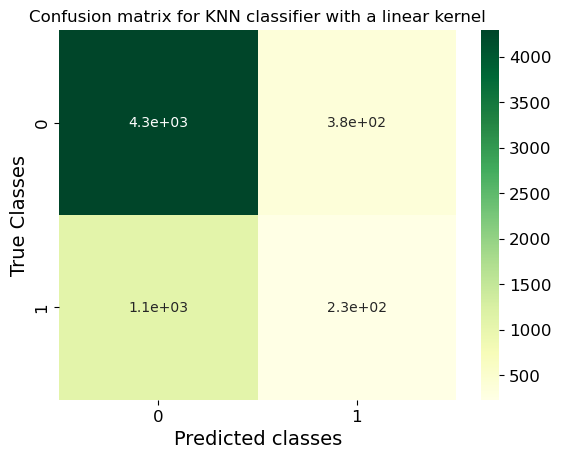

test accuracy for RF classifier: 78.52 %


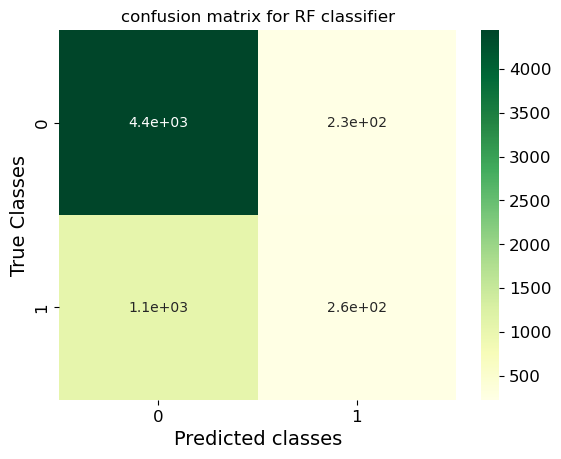

In [45]:
y_hat_knnc = final_model_knnc.predict(test[features])
y_hat_rfc = final_model_rfc.predict(test[features])

print('test accuracy for KNN classifier with a linear kernel:'\
      , round(accuracy_score(test[target], y_hat_knnc)*100, 2), '%')
plt.title('Confusion matrix for KNN classifier with a linear kernel')
sns.heatmap(confusion_matrix(test[target], y_hat_knnc), annot=True, cmap="YlGn")
plt.xlabel('Predicted classes')
plt.ylabel('True Classes')
plt.show()

print('test accuracy for RF classifier:', \
      round(accuracy_score(test[target], y_hat_rfc)*100, 2),'%')
plt.title('confusion matrix for RF classifier')
sns.heatmap(confusion_matrix(test[target], y_hat_rfc), annot=True, cmap="YlGn")
plt.xlabel('Predicted classes')
plt.ylabel('True Classes')
plt.show()

In [46]:
#Observations
# As shown above, the Random Forest Classifier model does seem to do better from an accuracy perspective for this dataset, having
# higher true positive and true negative.
# It also has fewer false positive than the KNN model, but tie in false negative predictions. 


In [47]:
## ROC Curve

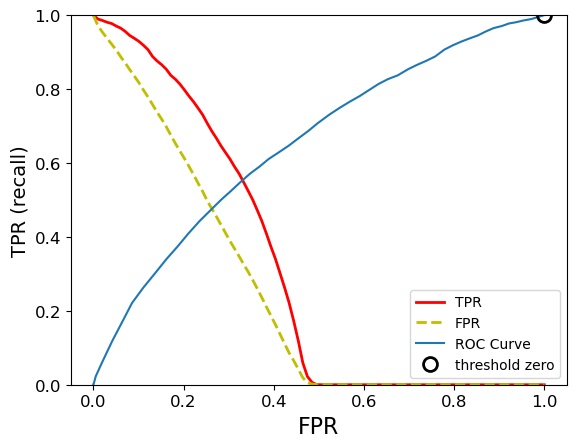

In [48]:
def calculate_tp_tn_fp_fn(true_target, predict_proba, threshold=0.5):
    from sklearn.metrics import confusion_matrix
    predict_adjusted = np.int_(predict_proba>threshold)
    cm=confusion_matrix(true_target, predict_adjusted)
    tp, tn, fp, fn = cm[1][1], cm[0][0], cm[0][1], cm[1][0]
    return tp, tn, fp, fn


def calculate_tpr_fpr_vs_threshold(true_target, predict_proba, steps):
    probability_thresholds = np.linspace(0, 1, steps)
    tpr_list = [0]*steps
    fpr_list = [0]*steps
    for i, val in enumerate(probability_thresholds):
        tp, tn, fp, fn = calculate_tp_tn_fp_fn(true_target, predict_proba, val)
        tpr_list[i] = tp/(tp+fn)
        fpr_list[i] = fp/(fp+tn)   
    return tpr_list, fpr_list, probability_thresholds


def plot_tpr_fpr_vs_threshold(model, X_train, y_train, steps=100, cv=5):
    from sklearn.model_selection import cross_val_predict
    y_scores = cross_val_predict(model, X_train, y_train, cv=cv, method="predict_proba")
    y_scores=y_scores[:,1]
    tpr, fpr, thresholds = calculate_tpr_fpr_vs_threshold(y_train, y_scores, steps)
    
    #=====================================
    #Xuan's
    #=====================================
    plt.plot(thresholds, tpr, "r-", label="TPR", linewidth=2)
    plt.plot(thresholds, fpr, "y--", label="FPR", linewidth=2)
    plt.xlabel("Probability threshold for positives", fontsize=16)
    plt.legend(loc="best", fontsize=15, frameon=True, facecolor=(0,0,0,0.4), framealpha=0.4)
    plt.ylim([0, 1])
    
    #=====================================
    #class note
    #=====================================
    plt.plot(fpr, tpr, label="ROC Curve")
    plt.xlabel("FPR")
    plt.ylabel("TPR (recall)")
    # find threshold closest to zero
    close_zero = np.argmin(np.abs(thresholds))
    plt.plot(fpr[close_zero], tpr[close_zero], 'o', markersize=10,
    label="threshold zero", fillstyle="none", c='k', mew=2)
    plt.legend(loc=4)

plot_tpr_fpr_vs_threshold(model, X_train, y_train)
#plot_tpr_fpr_vs_threshold(final_model_knnc, X_train_transformed, y_train)  #y_hat_knnc)
#plot_tpr_fpr_vs_threshold(model, X_train, y_hat_rfc)

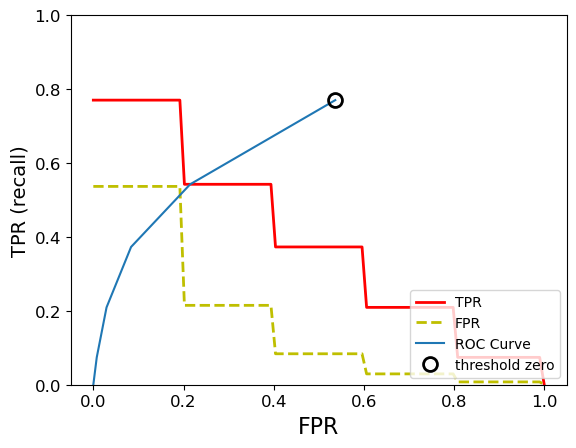

In [49]:
plot_tpr_fpr_vs_threshold(final_model_knnc, X_train_transformed, y_train) 


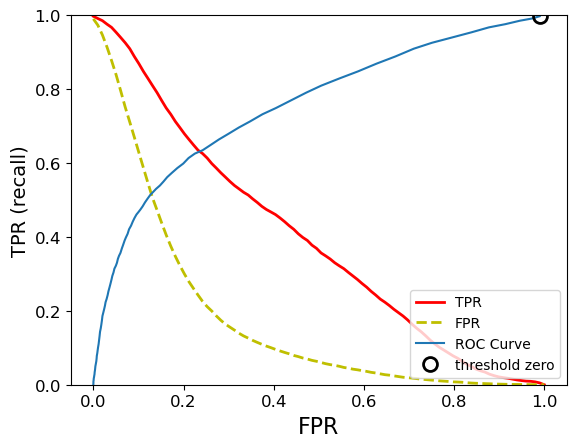

In [50]:
plot_tpr_fpr_vs_threshold(final_model_rfc, X_train_transformed, y_train) 


In [51]:
# both ROC curves mean they have higer recalls which mean they have more false postives
# hign recall mean high caught of correct cases but also high level incorrectness.

In [52]:
import numpy as np
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV

# Load dataset
X, y = X_train, y_train

# Define the parameter grid
param_grid = {
    'n_neighbors': [3, 5, 10, 20],
    'weights': ['uniform', 'distance']
}

# Create the KNN classifier
knn_classifier = KNeighborsClassifier()

# Initialize GridSearchCV
grid_search = GridSearchCV(
    estimator=knn_classifier,
    param_grid=param_grid,
    scoring='roc_auc',
    cv=5
)

# Fit the model to find the best hyperparameters
grid_search.fit(X, y)

# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best hyperparameters:", best_params)

C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 459, in _score
    y_pred = method_caller(clf, "decision_function", X, pos_label=pos_label)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 86, in _cached_call
    result, _ = _get_response_values(
                ^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\utils\_response.py", line 73, in _get_response_values
    prediction_method = _check_response_method(estimator, response_method)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\ut

C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 459, in _score
    y_pred = method_caller(clf, "decision_function", X, pos_label=pos_label)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 86, in _cached_call
    result, _ = _get_response_values(
                ^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\utils\_response.py", line 73, in _get_response_values
    prediction_method = _check_response_method(estimator, response_method)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\ut

C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 459, in _score
    y_pred = method_caller(clf, "decision_function", X, pos_label=pos_label)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 86, in _cached_call
    result, _ = _get_response_values(
                ^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\utils\_response.py", line 73, in _get_response_values
    prediction_method = _check_response_method(estimator, response_method)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\ut

C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 459, in _score
    y_pred = method_caller(clf, "decision_function", X, pos_label=pos_label)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 86, in _cached_call
    result, _ = _get_response_values(
                ^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\utils\_response.py", line 73, in _get_response_values
    prediction_method = _check_response_method(estimator, response_method)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\ut

Best hyperparameters: {'n_neighbors': 20, 'weights': 'distance'}


C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\model_selection\_search.py:976: UserWarning: One or more of the test scores are non-finite: [       nan 0.58864797        nan 0.60359105        nan 0.62559349
        nan 0.6380967 ]
  warnings.warn(


In [53]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Load dataset
X, y = X_train, y_train

# Define the parameter grid
param_grid = {
    'n_estimators': [4, 5, 10, 20, 50],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Create the Random Forest classifier
rf_classifier = RandomForestClassifier()

# Initialize GridSearchCV
grid_search = GridSearchCV(
    estimator=rf_classifier,
    param_grid=param_grid,
    scoring='roc_auc',
    cv=5
)

# Fit the model to find the best hyperparameters
grid_search.fit(X, y)

# Get the best hyperparameters
best_params = grid_search.best_params_
print("Best hyperparameters:", best_params)

C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
25 fits failed out of a total of 75.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
25 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\base.py", line 1144, in wrapper
    estimator._validate_params()
  File "C:\Users\ttang\anaconda3\Lib\site-packages\sklearn\base.py", line 637, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\ttang\anaconda3\Lib\site-packages\

Best hyperparameters: {'max_features': 'log2', 'n_estimators': 50}


#### Conclusions

In [54]:
# Which one performs better in the cross validation? Note down your observations and give comments.

# In summary, based on above observations and ROC curves, Random Forest Classifier performs better.
#
# As shown above, the Random Forest Classifier model does seem to do better from an accuracy perspective for this dataset, having
# higher true positive and true negative.
# It also has fewer false positive than the KNN model, but tie in false negative predictions. 

# both ROC curves mean they have higer recalls which mean they have more false postives
# hign recall mean high caught of correct cases but also high level incorrectness.
